<a href="https://colab.research.google.com/github/Foluwa/transfer_learning_keras/blob/main/Group_14_Transfer_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Deep Learning submission for group 14

#####  Moronfoluwa Akintola ( 22048063 )
#####  Kinza Hassan ( 22061674 )
#####  Tinubu Gabriel Oluwasogo ( 22065666 )
#####  Roseline Abosede Alao ( 22051527 )
#####  Oladeji Blessing ( 22061475 )
#####  Mansoor Imtiaz ( 22046808 )


In this project we selected ResNet, Efficientnet and built a custom CNN for our anlysis.



#### Install required libraries

In [1]:
!pip install visualkeras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 11.2 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!unzip drive/MyDrive/Archive.zip

Streaming output truncated to the last 5000 lines.
  inflating: seg_train/seg_train/mountain/16164.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._16164.jpg  
  inflating: seg_train/seg_train/mountain/3358.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._3358.jpg  
  inflating: seg_train/seg_train/mountain/2720.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._2720.jpg  
  inflating: seg_train/seg_train/mountain/14029.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._14029.jpg  
  inflating: seg_train/seg_train/mountain/14997.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._14997.jpg  
  inflating: seg_train/seg_train/mountain/1567.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._1567.jpg  
  inflating: seg_train/seg_train/mountain/11637.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._11637.jpg  
  inflating: seg_train/seg_train/mountain/15445.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._15445.jpg  
  i

In [4]:
import os
import cv2
import time
import random
import datetime
import itertools
import visualkeras
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix, classification_report

from tensorflow.keras import Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.applications import ResNet50, EfficientNetB0
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dropout, Flatten, Dense, LeakyReLU

plt.style.use('fivethirtyeight')
# os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

#### Constants

In [5]:
# Model Architecture
epochs = 20
img_width = img_height = 150
batch_size = 64 # 32
input_shape = (img_width, img_height, 3)
n_classes = 6
dimensions = (img_width, img_height)
input_shape = (img_width, img_height, 3)
image_size = (150, 150)
image_shape = (150, 150, 3)

####  Define train and test datasets




In [6]:
train_folder = "./seg_train/seg_train/"
test_folder = "./seg_test/seg_test/"

# Generates batches of augmented images
datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    rotation_range=20,
    horizontal_flip=True
)

# Load the images from folder
train_data = datagen.flow_from_directory(
    train_folder,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical'
)

test_data = datagen.flow_from_directory(
    test_folder,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical'
)

test_data_1 = tf.keras.preprocessing.image_dataset_from_directory(test_folder,
                                                               image_size = (img_width, img_height),
                                                               label_mode = 'categorical',
                                                               batch_size = batch_size,
                                                               shuffle = False)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
Found 3000 files belonging to 6 classes.



### Utility functions

In [7]:
def split_images_and_labels(data, full_dataset=True):
    """
    Separate the images and the labels and return them.
    full_dataset=False, it will take 10000 images
    """
    images = []
    labels = []

    if full_dataset:
        dataset_size = len(data)
    else:
        dataset_size = 10000

    for i in range(dataset_size):
        batch_images, batch_labels = next(data)
        images.append(batch_images)
        labels.append(batch_labels)

    images = np.concatenate(images)
    labels = np.concatenate(labels)

    return images, labels

In [8]:
# Function to load and preprocess data from a given directory.
def load_and_preprocess_data(directory, image_size):
    data = []
    labels = []
    for category in os.listdir(directory):
        category_folder = os.path.join(directory, category)
        label = category
        # Iterate through each image in the category folder
        for image_name in os.listdir(category_folder):
            image_path = os.path.join(category_folder, image_name)
            image = tf.keras.preprocessing.image.load_img(image_path, target_size=image_size)
            # Convert the image to a numpy array
            image_array = tf.keras.preprocessing.image.img_to_array(image)
            image_array = image_array / 255.0
            data.append(image_array)
            labels.append(label)
    return np.array(data), np.array(labels)

In [9]:
def display_confusion_matrix(test_labels, predicted_labels):
    """
      Generate the confusion matrix
    """
    conf_matrix = confusion_matrix(test_labels, predicted_labels)

    # Plot the confusion matrix using a heatmap.
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='viridis',
                xticklabels=[index_to_label[i] for i in range(len(index_to_label))],
                yticklabels=[index_to_label[i] for i in range(len(index_to_label))])
    plt.title('Confusion Matrix for ResNet Model')
    plt.ylabel('True Labels')
    plt.xlabel('Predicted Labels')
    return plt.show()

In [63]:
def evaluate_model(history, model, model_name=''):
    """
      Function to evaluate model
    """
    plt.figure(figsize=(12, 5))

    # Plot training and validation accuracy
    plt.subplot(121)
    plt.plot(history.history['accuracy'], color='blue', label='Train')
    plt.plot(history.history['val_accuracy'], color='orange', label='Validation')
    plt.title('Model Accuracy', fontsize=16, color='black')
    plt.ylabel('Accuracy', color='black')
    plt.xlabel('Epoch', color='black')
    plt.legend(loc='upper left', fontsize='large')
    plt.grid(True, color='gray', linestyle='--', linewidth=0.5)
    plt.tick_params(axis='x', colors='black')
    plt.tick_params(axis='y', colors='black')

    # Plot training and validation loss
    plt.subplot(122)
    plt.plot(history.history['loss'], color='blue', label='Train')
    plt.plot(history.history['val_loss'], color='orange', label='Validation')
    plt.title('Model Loss', fontsize=16, color='black')
    plt.ylabel('Loss', color='black')
    plt.xlabel('Epoch', color='black')
    plt.legend(loc='upper left', fontsize='large')
    plt.grid(True, color='gray', linestyle='--', linewidth=0.5)
    plt.tick_params(axis='x', colors='black')
    plt.tick_params(axis='y', colors='black')

    plt.suptitle(f'{model_name} Performance', fontsize=20, color='black')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(f'{model_name}_performance.png', transparent=True)
    return plt.show()

In [11]:
def load_and_prep_image(filename, img_shape = 150, scale = True):
    """
       Function to load and prepare images
    """
    img = tf.io.read_file(filename)

    # Decode image into tensor
    img = tf.io.decode_image(img, channels = 3)

    # Resize the image
    img = tf.image.resize(img, size = [img_shape, img_shape])
    if scale:
        # rescale the image (get all values between 0 and 1)
        return img/255.
    else:
        # don't need to rescale images for EfficientNet models in TensorFlow
        return img

In [12]:
def load_data():
    """
        Load the data:
            - 14,034 images to train the network.
            - 3,000 images to evaluate how accurately the network learned to classify images.
    """

    datasets = ['./seg_train/seg_train', './seg_test/seg_test']
    output = []

    # Iterate through training and test sets
    for dataset in datasets:

        images = []
        labels = []

        print("Loading {}".format(dataset))

        # Iterate through each folder corresponding to a category
        for folder in os.listdir(dataset):
            label = class_names_label[folder]

            # Iterate through each image in the folder
            for file in tqdm(os.listdir(os.path.join(dataset, folder))):

                # Get the path name of the image
                img_path = os.path.join(os.path.join(dataset, folder), file)

                # Open and resize the img
                image = cv2.imread(img_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image = cv2.resize(image, image_size)

                # Append the image and its corresponding label to the output
                images.append(image)
                labels.append(label)

        images = np.array(images, dtype = 'float32')
        labels = np.array(labels, dtype = 'int32')

        output.append((images, labels))

    return output

In [13]:
def plot_loss_curves(history):
    """
       Define a function to plot loss curves
    """
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    epochs = range(len(history.history['loss']))

    # Plot loss
    plt.figure(figsize = (15, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label='training_loss')
    plt.plot(epochs, val_loss, label='val_loss')
    plt.title('Training Loss vs Validation Loss')
    plt.xlabel('Epochs')
    plt.legend()

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label='training_accuracy')
    plt.plot(epochs, val_accuracy, label='val_accuracy')
    plt.title('Training Accuracy vs Validation Accuracy')
    plt.xlabel('Epochs')
    return plt.legend();

### Extract the pre-defined classes

In [14]:
# Get class names
classes = list(train_data.class_indices.keys())

# Print the class names
print(classes)

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


In [15]:
# Convert label to index
label_to_index = {label: index for index, label in enumerate(classes)}

In [16]:
# Convert numerical labels back to class names
index_to_label = {index: label for label, index in label_to_index.items()}

### Plot Sample Images

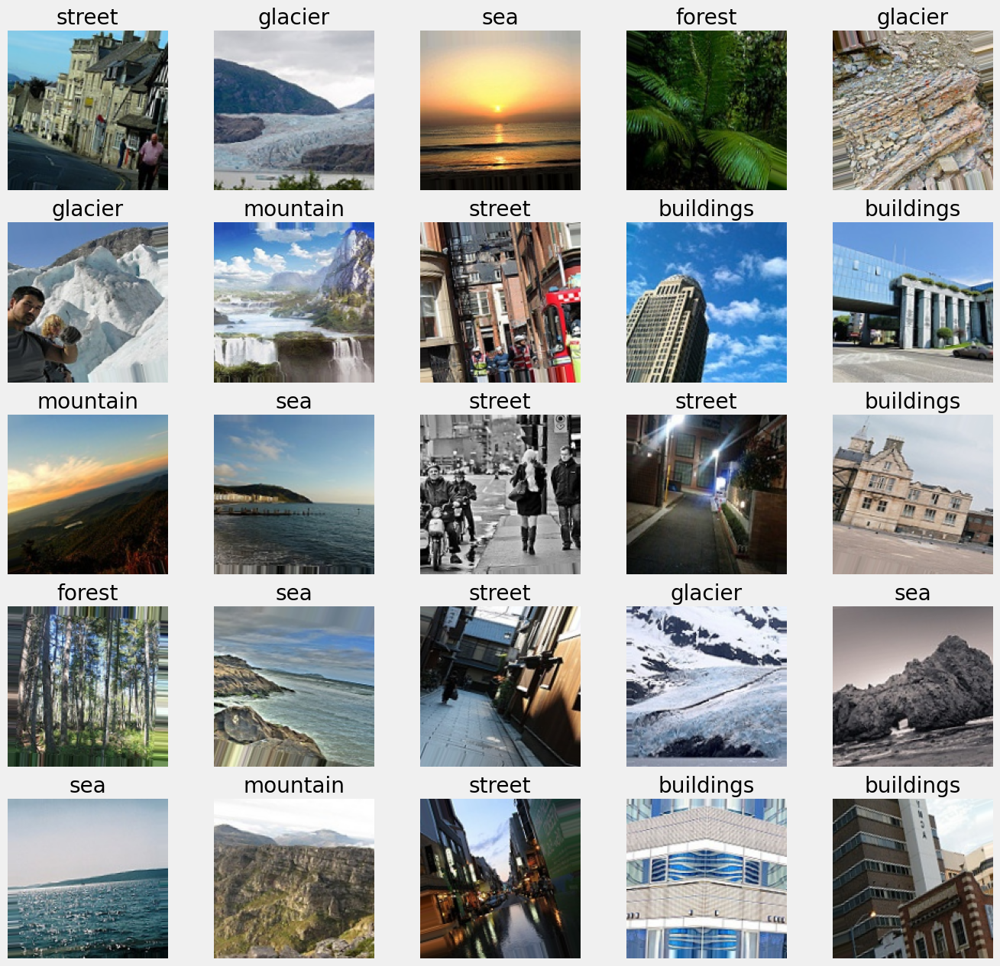

In [17]:
images, labels = next(train_data)

# Plot the first few images and their labels
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(15, 15))
for i, ax in enumerate(axes.flat):
    ax.imshow(images[i])
    label_index = np.argmax(labels[i])
    ax.set_title(classes[label_index])
    ax.axis('off')

plt.show()

In [18]:
# Load Train and Test data (CNN)
train_images, train_labels = split_images_and_labels(train_data)
test_images, test_labels = split_images_and_labels(test_data)

(-0.5, 149.5, 149.5, -0.5)

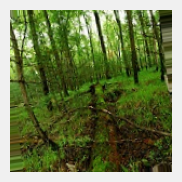

In [19]:
plt.figure(figsize=(2,2))
plt.imshow(test_images[0])
plt.axis('off')

In [20]:
print(f"Training set: {len(train_images)} images and {len(train_labels)} labels")
print(f"Test set: {len(test_images)} images and {len(test_labels)} labels")
print(f"Train images shape: {train_images.shape} - Test images shape: {test_images.shape}")
print(f"The {train_labels.shape[1]} classes are represented as one-hot vectors of shape {train_labels.shape}")

Training set: 14034 images and 14034 labels
Test set: 3000 images and 3000 labels
Train images shape: (14034, 150, 150, 3) - Test images shape: (3000, 150, 150, 3)
The 6 classes are represented as one-hot vectors of shape (14034, 6)


In [21]:
class_names_label = {class_name:i for i, class_name in enumerate(classes)}

## Explore the dataset

In [22]:
(train_images_, train_labels_), (test_images_, test_labels_) = load_data()
_, train_counts = np.unique(train_labels_, return_counts=True)
_, test_counts = np.unique(test_labels_, return_counts=True)

Loading ./seg_train/seg_train


100%|██████████| 2404/2404 [00:01<00:00, 2069.37it/s]


Loading ./seg_test/seg_test


100%|██████████| 553/553 [00:00<00:00, 2177.36it/s]


In [23]:
print(train_images.shape)
print(test_images.shape)
print(train_labels.shape)
print(test_labels.shape)

(14034, 150, 150, 3)
(3000, 150, 150, 3)
(14034, 6)
(3000, 6)


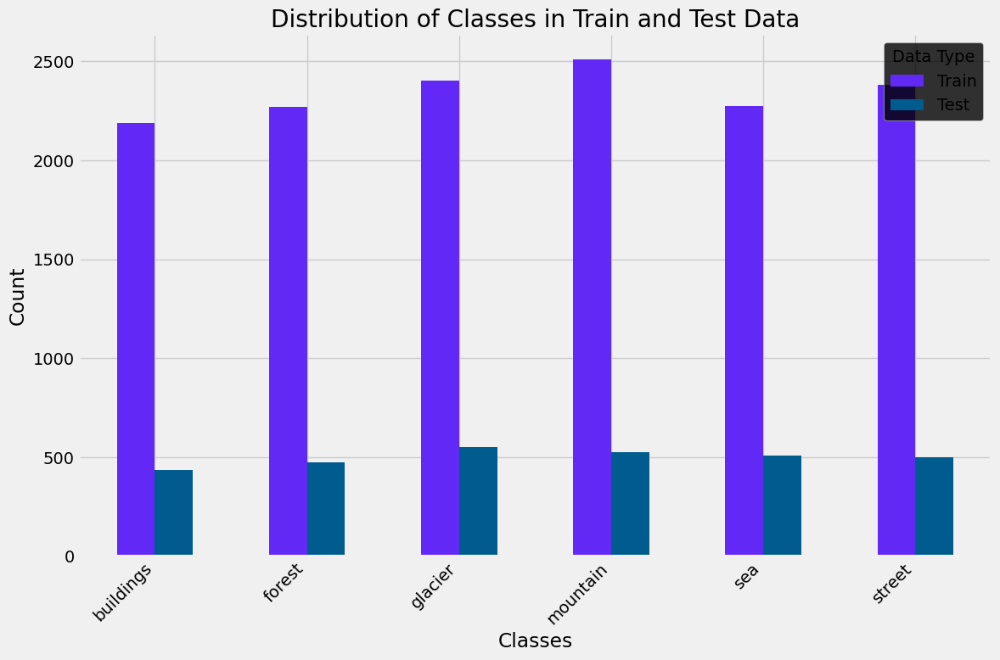

In [24]:
# Create DataFrame
df_distribution = pd.DataFrame({'Train': train_counts, 'Test': test_counts}, index=classes)

# Set color codes
colors = ['#6128f6', '#005c8f']

chart_text_color = '#000' #white

# Plot
ax = df_distribution.plot(kind='bar', figsize=(12, 8), color=colors)
ax.set_ylabel('Count', color=chart_text_color)
ax.set_xlabel('Classes', color=chart_text_color)
ax.set_title('Distribution of Classes in Train and Test Data', color=chart_text_color)
ax.legend(title='Data Type', loc='upper right', facecolor=chart_text_color)
plt.xticks(rotation=45, ha='right', color=chart_text_color)
plt.yticks(color=chart_text_color)
plt.tight_layout()

# Save as transparent PNG file
# plt.savefig('distribution_plot.png', transparent=True)

plt.show()

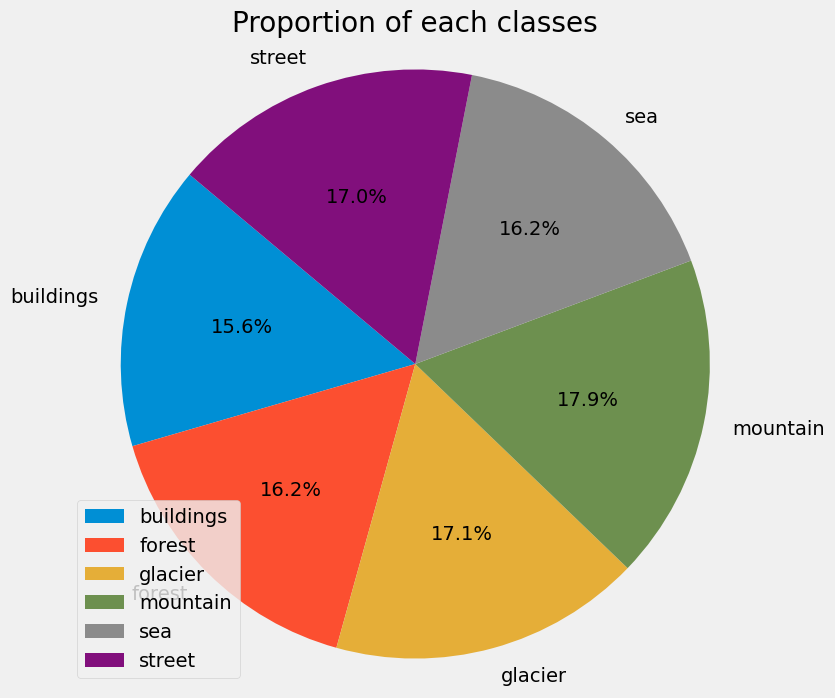

In [25]:
plt.figure(figsize=(8, 8))

# Plot the pie chart
patches, texts, autotexts = plt.pie(train_counts,
                                    explode=(0, 0, 0, 0, 0, 0),
                                    labels=classes,
                                    autopct='%1.1f%%',
                                    startangle=140)

# Add legend
plt.legend(patches, classes, loc="best")

# Set aspect ratio to be equal to ensure circular shape
plt.axis('equal')

# Add title
plt.title('Proportion of each classes')

# Show the plot
plt.show()

# What is transfer learning ?

Transfer learning is a machine learning technique where a model developed for a specific task is reused as the starting point for a model on a second task. This approach is highly beneficial when dealing with limited data for a new task, as it leverages the knowledge gained from a large previously solved problem to achieve better performance with less data. It can be traced back to educational psychology, where psychologist C. H. Judd introduced the generalization theory of transfer. According to this theory, the ability to transfer learning from one situation to another stems from the generalization of experiences. Individuals can apply skills and knowledge in one context to different situations as long as they can generalize their experiences [1].

Transfer learning not only accelerates the development process but also enhances the generalization capabilities of models to new, unseen data. By enabling the reuse of existing models, transfer learning fosters more efficient and effective machine learning workflows across a wide range of applications. It is very popular in deep learning applications such as image and speech recognition, where pre-trained models on extensive datasets can significantly reduce training time and computational resources.


# Neural Networks

### 1.  Convolutional Neural Network (CNN)

A Convolutional Neural Network (CNN) is a deep learning algorithm that takes an input image, assigns importance (learnable weights and biases) to various objects in the image, and can differentiate one from the other. The architecture of a CNN is designed to mimic the way the human brain processes visual information, using a series of layers that filter and pool the input image to create a hierarchy of features.
We implemented a CNN from scratch to benchmark against the pre-trained models.  Our CNN architecture consists of an input layer that takes an image of size 150x150 with 3 color channels (RGB). It then passes through multiple convolutional layers (Conv2D), where filters are applied to detect spatial hierarchies of features, and max pooling layers (MaxPooling2D), which reduce the spatial dimensions of the feature maps. After several convolutional and pooling layers, the feature maps are flattened into a single vector and passed through fully connected layers (Dense), culminating in an output layer that makes the final classification which is 6 classes in our case.


In [26]:
# Define the model
cnn_model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(256, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(n_classes, activation='softmax')
])

##### Display CNN model architecture

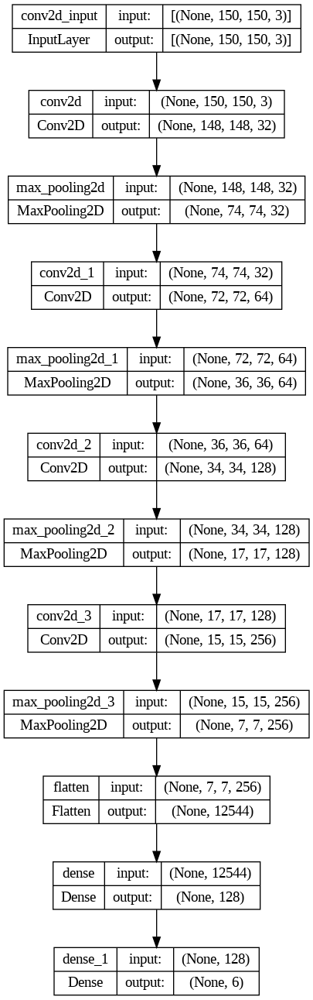

In [27]:
plot_model(cnn_model, 'cnn_model.png', show_shapes=True)

In [28]:
cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 74, 74, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 17, 17, 128)       0

##### Model Training

In [29]:
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

loss_stop = EarlyStopping(monitor='val_loss', patience=4, mode='min', verbose=1)
accuracy_stop = EarlyStopping(monitor='val_accuracy', patience=2)

start_time = time.time()
history_cnn_model = cnn_model.fit(train_data,
                batch_size=batch_size,
                epochs=10,
                validation_data=test_data,
                callbacks=[accuracy_stop, loss_stop])
end_time = time.time()

Epoch 1/10
220/220 [==============================] - 90s 384ms/step - loss: 1.0870 - accuracy: 0.5690 - val_loss: 0.8805 - val_accuracy: 0.6533
Epoch 2/10
220/220 [==============================] - 83s 378ms/step - loss: 0.8200 - accuracy: 0.6930 - val_loss: 0.7175 - val_accuracy: 0.7390
Epoch 3/10
220/220 [==============================] - 83s 380ms/step - loss: 0.6913 - accuracy: 0.7449 - val_loss: 0.6296 - val_accuracy: 0.7680
Epoch 4/10
220/220 [==============================] - 82s 371ms/step - loss: 0.6164 - accuracy: 0.7723 - val_loss: 0.6472 - val_accuracy: 0.7583
Epoch 5/10
220/220 [==============================] - 83s 375ms/step - loss: 0.5539 - accuracy: 0.8015 - val_loss: 0.5117 - val_accuracy: 0.8123
Epoch 6/10
220/220 [==============================] - 84s 381ms/step - loss: 0.5061 - accuracy: 0.8122 - val_loss: 0.5130 - val_accuracy: 0.8193
Epoch 7/10
220/220 [==============================] - 83s 379ms/step - loss: 0.4731 - accuracy: 0.8298 - val_loss: 0.4409 - val_ac

In [30]:
print("Elapsed time: {:.2f} hours" .format((end_time - start_time) / 3600))

Elapsed time: 0.21 hours


##### Model Evaluation

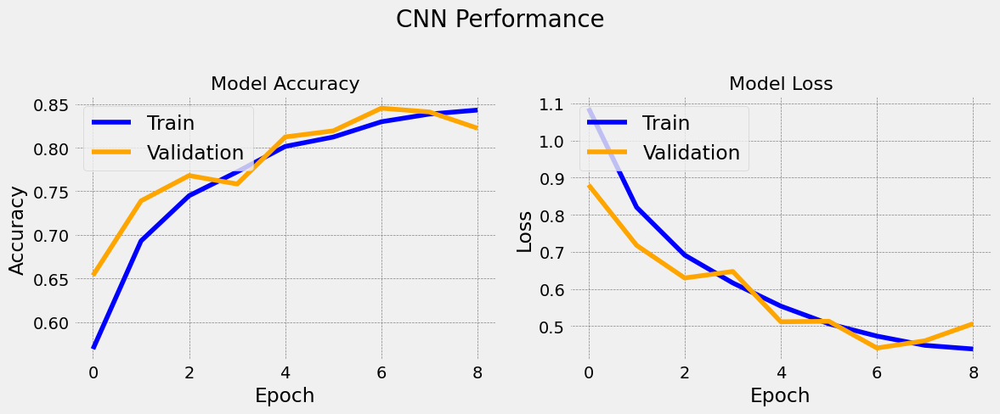

In [64]:
evaluate_model(history_cnn_model, cnn_model, 'CNN')

##### Model Prediction

94/94 [==============================] - 1s 6ms/step


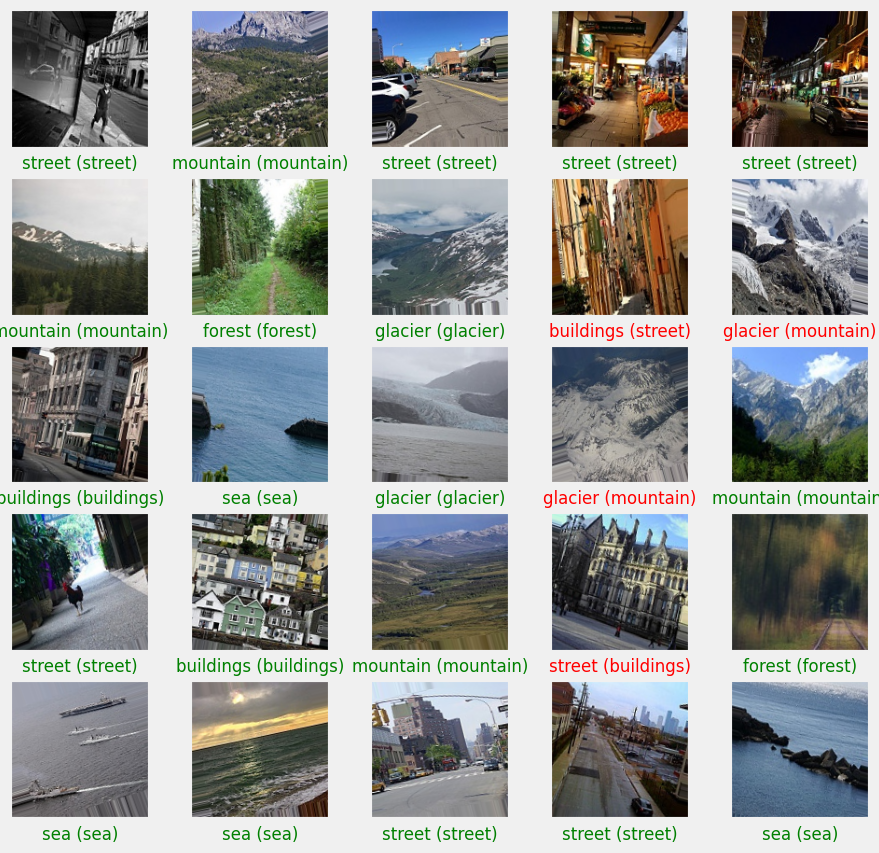

In [33]:
# First, get predictions for test images
cnn_model_predicted_scores = cnn_model.predict(test_images)
cnn_model_predicted_labels = np.argmax(cnn_model_predicted_scores, axis=1)

# Select 25 random image indices from the test set
random_indices = np.random.choice(len(test_images), size=25, replace=False)

plt.figure(figsize=(10,10))
for idx, random_index in enumerate(random_indices):
    plt.subplot(5,5,idx+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test_images[random_index])
    predicted_label = index_to_label[cnn_model_predicted_labels[random_index]]
    true_label = index_to_label[np.argmax(test_labels[random_index])]

    if predicted_label == true_label:
        color = 'green'
    else:
        color = 'red'
    plt.xlabel(f"{predicted_label} ({true_label})", color=color, fontsize=12)
plt.show()

##### CNN Confusion Matrix

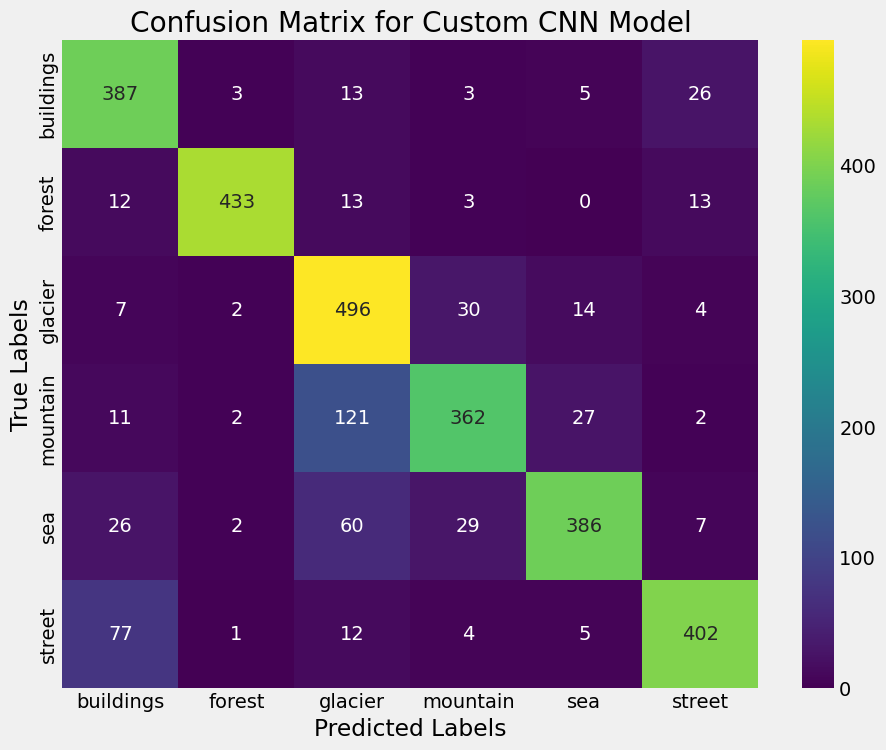

In [34]:
# Convert predicted labels from one-hot encoded format to categorical
cnn_model_predicted_labels_categorical = np.argmax(cnn_model_predicted_scores, axis=1)

# Generate the confusion matrix
conf_matrix = confusion_matrix(np.argmax(test_labels, axis=1), cnn_model_predicted_labels_categorical)


# Plot the confusion matrix using a heatmap.
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='viridis',
            xticklabels=[index_to_label[i] for i in range(len(index_to_label))],
            yticklabels=[index_to_label[i] for i in range(len(index_to_label))])
plt.title('Confusion Matrix for Custom CNN Model')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()

### 2. EfficientNetB0


The EfficientNet model is a family of Convolutional Neural Networks (CNNs) designed to achieve state-of-the-art accuracy on image classification tasks while being highly efficient in terms of computational resources. It was developed by researchers at Google, the original purpose of EfficientNet was to provide a scalable and efficient solution for deep learning models that could perform well across a wide range of computing devices and constraints.
It was trained on the ImageNet dataset, making it highly versatile for various image classification tasks.

EfficientNet strikes a balance between network width, resolution, and depth through the composite scaling coefficient, ensuring that the model has superior performance as the network scales up in complexity. This approach allows EfficientNet to achieve much higher accuracy with significantly fewer parameters and computational power compared to previous models.


In [36]:
# Create the Tensorboard callback
def create_tensorboard_callback(dir_name, experiment_name):
    log_dir = dir_name + "/" + experiment_name + "/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir)
    print(f"Saving TensorBoard log files to: {log_dir}")
    return tensorboard_callback

In [37]:
# Create the data augmentation layer
data_augmentation_efficientnetb0 = Sequential([
    preprocessing.RandomFlip('horizontal'),
    preprocessing.RandomRotation(0.2),
    preprocessing.RandomHeight(0.2),
    preprocessing.RandomWidth(0.2),
    preprocessing.RandomZoom(0.2),
])

In [38]:
# Create the checkpoint path
checkpoint_path = 'efficientnetb0_model/checkpoint.ckpt'
checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                      save_weights_only=True,
                                      monitor="val_accuracy",
                                      save_best_only=True)

Training the EfficientNetB0 Model

In [39]:
# Create the base model and freeze its layers
base_model_efficientnetb0 = tf.keras.applications.EfficientNetB0(include_top = False)
base_model_efficientnetb0.trainable = False

# Create the model architecture with trainable top layers
inputs = layers.Input(shape = image_shape, name = 'input_layer')

# Add the data augmentation layer
x = data_augmentation_efficientnetb0(inputs)
x = base_model_efficientnetb0(x, training = False)
x = layers.GlobalAveragePooling2D(name = 'global_avg_pool_layer')(x)
outputs = layers.Dense(6, activation = 'softmax', name = 'output_layer')(x)
efficientnetb0_model = tf.keras.Model(inputs, outputs)

# Compile the model
efficientnetb0_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),
                                      optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),
                                      metrics = ['accuracy'])

# Fit the model
history_efficientnetb0_model = efficientnetb0_model.fit(
                                                                    train_data,
                                                                    epochs = 10,
                                                                    steps_per_epoch = len(train_data),
                                                                    validation_data = test_data,
                                                                    validation_steps = int(0.25 * len(test_data)),
                                                                    callbacks = [create_tensorboard_callback(dir_name = 'training_logs',
                                                                                                             experiment_name = 'efficientnetb0_model'),
                                                                                checkpoint_callback])

16705208/16705208 [==============================] - 0s 0us/step
Saving TensorBoard log files to: training_logs/efficientnetb0_model/20240327-145624
Epoch 1/10
220/220 [==============================] - 83s 343ms/step - loss: 1.8019 - accuracy: 0.1709 - val_loss: 1.7900 - val_accuracy: 0.1832
Epoch 2/10
220/220 [==============================] - 73s 331ms/step - loss: 1.7940 - accuracy: 0.1712 - val_loss: 1.7887 - val_accuracy: 0.1818
Epoch 3/10
220/220 [==============================] - 73s 332ms/step - loss: 1.7944 - accuracy: 0.1709 - val_loss: 1.7955 - val_accuracy: 0.1719
Epoch 4/10
220/220 [==============================] - 74s 338ms/step - loss: 1.7930 - accuracy: 0.1780 - val_loss: 1.8077 - val_accuracy: 0.1506
Epoch 5/10
220/220 [==============================] - 72s 328ms/step - loss: 1.7942 - accuracy: 0.1727 - val_loss: 1.7938 - val_accuracy: 0.1293
Epoch 6/10
220/220 [==============================] - 72s 327ms/step - loss: 1.7929 - accuracy: 0.1721 - val_loss: 1.7918 - va

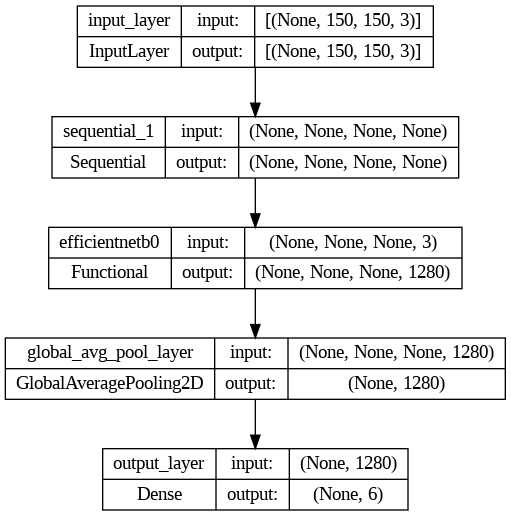

In [40]:
plot_model(efficientnetb0_model, 'efficientnetb0_model.png', show_shapes=True)

##### Model evaluation

In [41]:
# Evaluate our model on the whole test data
efficientnetb0_model_results = efficientnetb0_model.evaluate(test_data, verbose = 0)
print("Validation Loss: : {:.3f}, Validation Accuracy: {:.3f}".format(efficientnetb0_model_results[0], efficientnetb0_model_results[1]))

Validation Loss: : 1.788, Validation Accuracy: 0.184


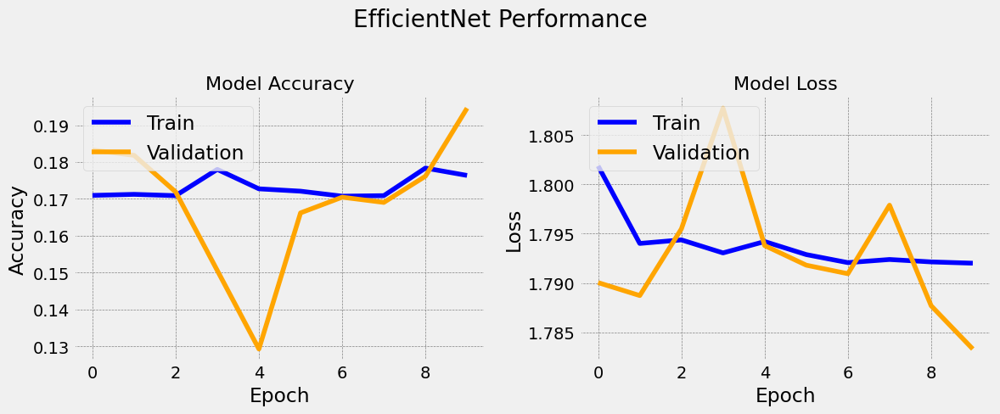

In [65]:
evaluate_model(history_efficientnetb0_model, efficientnetb0_model, 'EfficientNet')

Making predictions on the test data

1/1 [==============================] - 0s 25ms/step


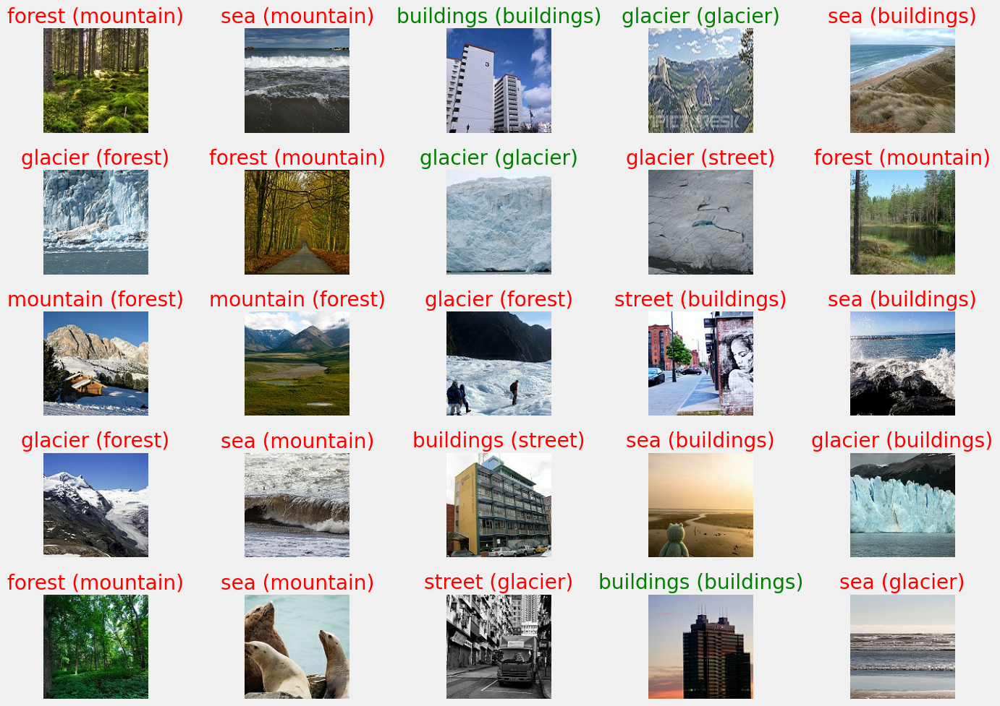

In [44]:
plt.figure(figsize=(15, 10))

for i in range(25):
    # Choose random image(s) from random class(es)
    class_name = random.choice(classes)
    filename = random.choice(os.listdir(os.path.join(test_folder, class_name)))
    filepath = os.path.join(test_folder, class_name, filename)

    # Load the image and make predictions
    img = load_and_prep_image(filepath, scale=False)
    pred_prob = efficientnetb0_model.predict(tf.expand_dims(img, axis=0))
    pred_class = classes[pred_prob.argmax()]

    # Plot the image(s) on a 5x5 grid
    plt.subplot(5, 5, i+1)
    plt.imshow(img/255.)
    if class_name == pred_class:
        title_color = 'green'
    else:
        title_color = 'red'
    plt.title(f'{class_name} ({pred_class})', c=title_color)
    plt.axis(False)

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

Analyzing the classification reports & Plotting the confusion matrix

In [45]:
# Make a couple of preparations
yLabels = []
for images, labels in test_data_1.unbatch():
    yLabels.append(labels.numpy().argmax())

predProbs = efficientnetb0_model.predict(test_data_1)
predClasses = predProbs.argmax(axis = 1)

# Check the classification reports by printing it out
print(classification_report(y_true = yLabels, y_pred = predClasses))

47/47 [==============================] - 2s 23ms/step
              precision    recall  f1-score   support

           0       0.15      0.24      0.19       437
           1       0.06      0.04      0.05       474
           2       0.16      0.22      0.18       553
           3       0.14      0.14      0.14       525
           4       0.24      0.05      0.08       510
           5       0.21      0.23      0.22       501

    accuracy                           0.15      3000
   macro avg       0.16      0.15      0.14      3000
weighted avg       0.16      0.15      0.14      3000



In [46]:
# Get a dataframe of the classification report
classification_report_df = pd.DataFrame(dict(classification_report(yLabels, predClasses, output_dict = True)))
classification_report_df.T

,precision,recall,f1-score,support
0,0.150492,0.244851,0.186411,437.000000
1,0.055096,0.042194,0.047790,474.000000
2,0.157274,0.216998,0.182371,553.000000
3,0.139360,0.140952,0.140152,525.000000
4,0.237113,0.045098,0.075783,510.000000
5,0.211215,0.225549,0.218147,501.000000
accuracy,0.152333,0.152333,0.152333,0.152333
macro avg,0.158425,0.152607,0.141775,3000.000000
weighted avg,0.159588,0.152333,0.142162,3000.000000


94/94 [==============================] - 2s 19ms/step


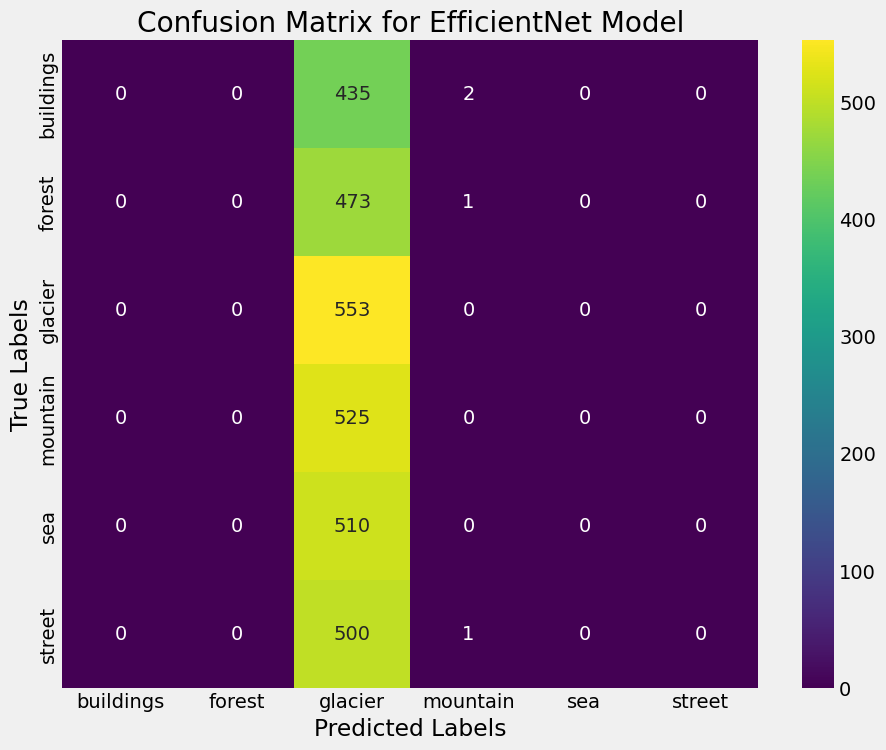

In [47]:
efficientnetb0_model_predicted_scores = efficientnetb0_model.predict(test_images)
efficientnetb0_model_predicted_labels = np.argmax(efficientnetb0_model_predicted_scores, axis=1)

# Convert predicted labels from one-hot encoded format to categorical
efficientnetb0_model_predicted_labels_categorical = np.argmax(efficientnetb0_model_predicted_scores, axis=1)

# Generate the confusion matrix
efficientnetb0_conf_matrix = confusion_matrix(np.argmax(test_labels, axis=1), efficientnetb0_model_predicted_labels_categorical)


# Plot the confusion matrix using a heatmap.
plt.figure(figsize=(10, 8))
sns.heatmap(efficientnetb0_conf_matrix, annot=True, fmt='d', cmap='viridis',
            xticklabels=[index_to_label[i] for i in range(len(index_to_label))],
            yticklabels=[index_to_label[i] for i in range(len(index_to_label))])
plt.title('Confusion Matrix for EfficientNet Model')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()

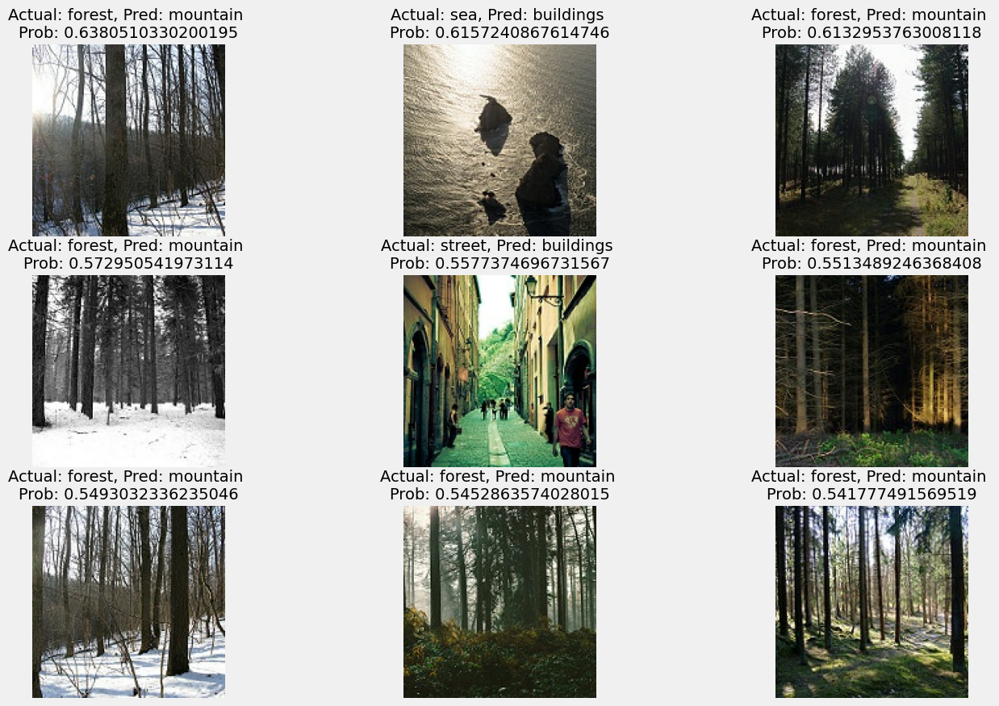

In [49]:
"""
  Detect the wrong predictions
"""
# Get all of the image file paths in the test dataset
filepaths = []
for filepath in test_data_1.list_files('./seg_test/seg_test/*/*.jpg', shuffle = False):
    filepaths.append(filepath.numpy())

# Create a DataFrame of different parameters for each of our test images
import pandas as pd
pred_df = pd.DataFrame({'img_path': filepaths,
                        'y_true': yLabels,
                        'y_pred': predClasses,
                        'pred_conf': predProbs.max(axis = 1),
                        'y_true_classname': [classes[i] for i in yLabels],
                        'y_pred_classname': [classes[i] for i in predClasses]})

# Find out in our DataFrame which predictions are wrong
pred_df['pred_correct'] = pred_df['y_true'] == pred_df['y_pred']

# Sort our DataFrame to have most wrong predictions at the top
top_100_wrong = pred_df[pred_df['pred_correct'] == False].sort_values('pred_conf', ascending = False)[:100]

# Visualize the test data samples which have the wrong prediction but highest prediction probability
images_to_view = 9
start_index = 0
plt.figure(figsize = (15, 10))
for i, row in enumerate(top_100_wrong[start_index: start_index + images_to_view].itertuples()):
    plt.subplot(3, 3, i + 1)
    img = load_and_prep_image(row[1], scale = False)
    _, _, _, _, pred_prob, y_true_classname, y_pred_classname, _ = row
    plt.imshow(img/255.)
    plt.title(f'Actual: {y_true_classname}, Pred: {y_pred_classname} \nProb: {pred_prob}', fontsize=14)
    plt.axis(False)

### 3. ResNet50


The Residual Network ( ResNet ) model, is a type of Convolutional Neural Network (CNN) that was introduced by researchers at Microsoft Research. It was designed to solve the problem of vanishing gradients in deep neural networks by introducing residual blocks, which allow for the training of much deeper networks by using skip connections or shortcuts to jump over some layers. The original purpose of ResNet was to significantly improve the performance of image classification tasks on large-scale datasets like ImageNet, where it achieved remarkable success, winning the 2015 ImageNet Large Scale Visual Recognition Challenge (ILSVRC). These skip connections help to preserve the gradient flow through the network, making it possible to train networks with over a hundred layers effectively. ResNet models come in various depths including ResNet-50, ResNet-101 and ResNet-152, indicating the number of layers in the network.


In [50]:
# Load pre-trained ResNet model
resnet_base_model = ResNet50(weights='imagenet', include_top=False, input_shape=image_shape)

# Freeze the base model
resnet_base_model.trainable = False

# Create the sequential model
resnet50_model = tf.keras.Sequential([
    resnet_base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(n_classes, activation='softmax')
])

# Compile the model
resnet50_model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Print model summary
resnet50_model.summary()

94765736/94765736 [==============================] - 0s 0us/step
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 5, 5, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_2 (Dense)             (None, 1024)              2098176   
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_3 (Dense)             (None, 6)                 6150      
                                                                 
Total params: 25692038 (98.01 MB)
Trainable params: 210

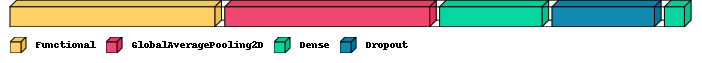

In [51]:
visualkeras.layered_view(resnet50_model,legend=True)

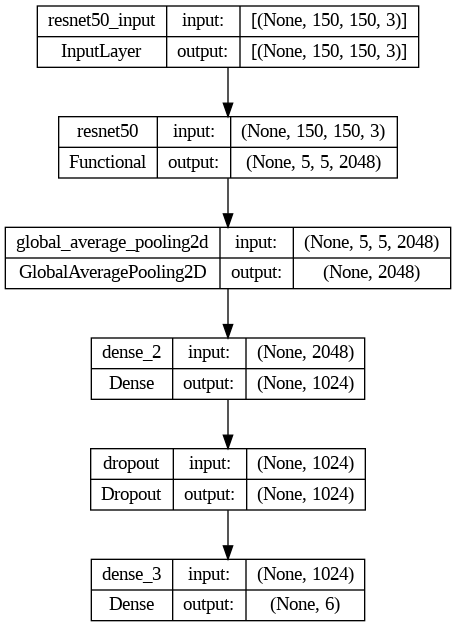

In [52]:
plot_model(resnet50_model, 'resnet50_model.png', show_shapes=True)

94/94 [==============================] - 4s 24ms/step


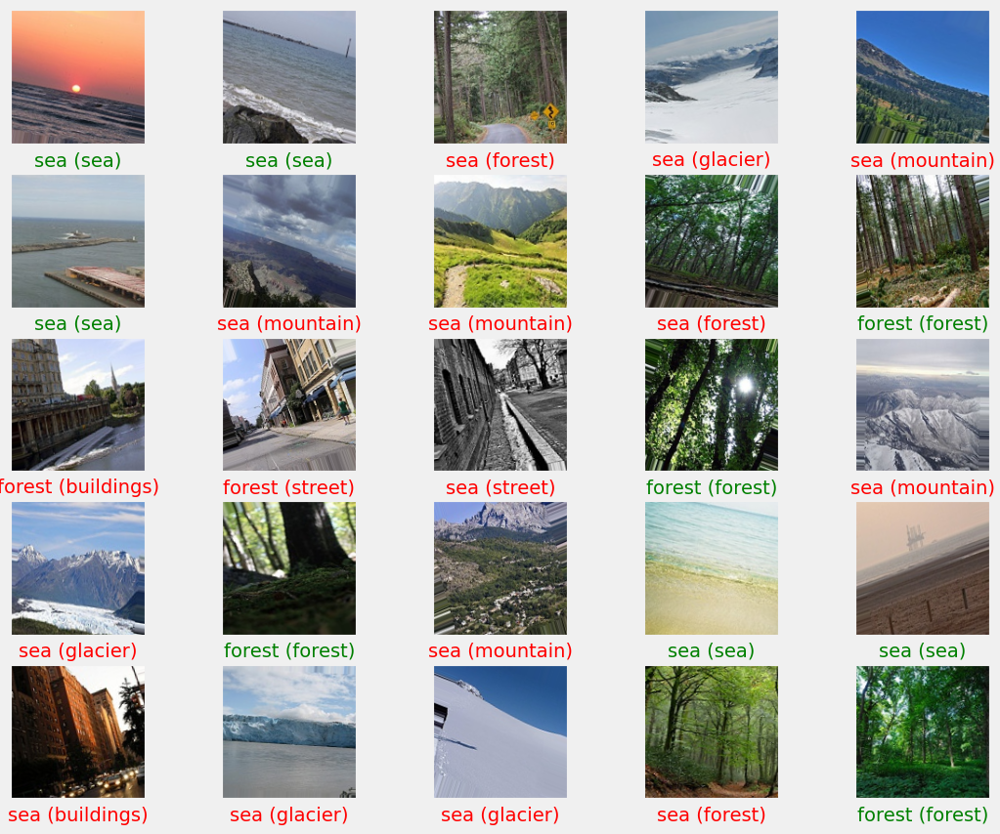

In [53]:
# First, get predictions for validation images
resnet_predicted_scores = resnet50_model.predict(test_images)
resnet_predicted_labels = np.argmax(resnet_predicted_scores, axis=1)

# Convert numerical labels back to class names
index_to_label = {index: label for label, index in label_to_index.items()}

# Select 25 random image indices from the test set
random_indices = np.random.choice(len(test_images), size=25, replace=False)

plt.figure(figsize=(12,10))
for idx, random_index in enumerate(random_indices):
    plt.subplot(5,5,idx+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test_images[random_index])
    predicted_label = index_to_label[resnet_predicted_labels[random_index]]
    true_label = index_to_label[np.argmax(test_labels[random_index])]

    if predicted_label == true_label:
        color = 'green'
    else:
        color = 'red'
    plt.xlabel(f"{predicted_label} ({true_label})", color=color, fontsize=14)
plt.show()


In [54]:
# min means we want to 'minimize' the loss
loss_stop = EarlyStopping(monitor='val_loss', patience=2, mode='min', verbose=1)
accuracy_stop = EarlyStopping(monitor='val_accuracy', patience=2)

start_time = time.time()
resnet50_history = resnet50_model.fit(train_data,
                                epochs=10,
                                validation_data=test_data,
                                callbacks=[accuracy_stop, loss_stop])
end_time = time.time()
enet_time = end_time - start_time

Epoch 1/10
220/220 [==============================] - 91s 391ms/step - loss: 1.5935 - accuracy: 0.3249 - val_loss: 1.3899 - val_accuracy: 0.4437
Epoch 2/10
220/220 [==============================] - 84s 384ms/step - loss: 1.3691 - accuracy: 0.4246 - val_loss: 1.2830 - val_accuracy: 0.4800
Epoch 3/10
220/220 [==============================] - 84s 382ms/step - loss: 1.2994 - accuracy: 0.4582 - val_loss: 1.2373 - val_accuracy: 0.4570
Epoch 4/10
220/220 [==============================] - 83s 379ms/step - loss: 1.2544 - accuracy: 0.4773 - val_loss: 1.1893 - val_accuracy: 0.5063
Epoch 5/10
220/220 [==============================] - 84s 382ms/step - loss: 1.2143 - accuracy: 0.4952 - val_loss: 1.1655 - val_accuracy: 0.5207
Epoch 6/10
220/220 [==============================] - 84s 383ms/step - loss: 1.1904 - accuracy: 0.4969 - val_loss: 1.1667 - val_accuracy: 0.5217
Epoch 7/10
220/220 [==============================] - 82s 371ms/step - loss: 1.1715 - accuracy: 0.5174 - val_loss: 1.1259 - val_ac

Efficient Net - Execution time: 14 minutes


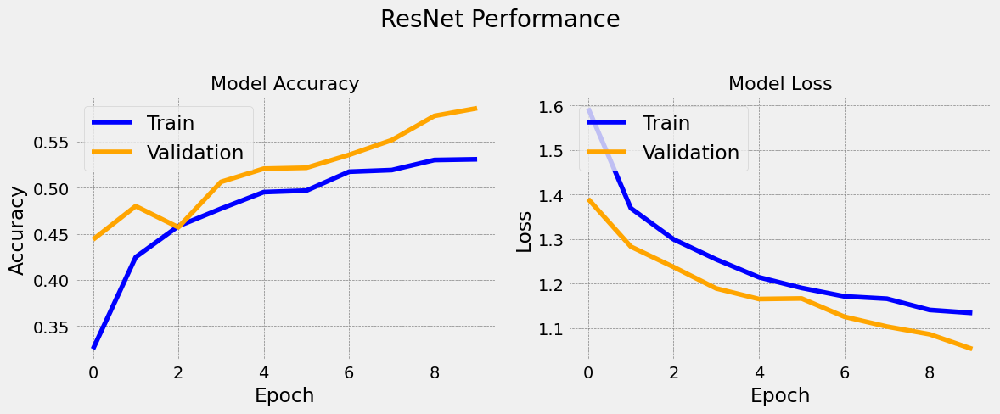

In [66]:
print(f"Efficient Net - Execution time: {round(enet_time / 60)} minutes")
evaluate_model(resnet50_history, resnet50_model, 'ResNet')

In [57]:
# First, get predictions for test images
resnet50_model_predicted_scores = resnet50_model.predict(test_images)
resnet50_model_predicted_labels = np.argmax(resnet50_model_predicted_scores, axis=1)

94/94 [==============================] - 2s 20ms/step


In [58]:
# Convert predicted labels from one-hot encoded format to categorical labels
resnet50_model_predicted_labels_categorical = np.argmax(resnet50_model_predicted_scores, axis=1)

# Generate the confusion matrix
conf_matrix_resnet = confusion_matrix(np.argmax(test_labels, axis=1), resnet50_model_predicted_labels_categorical)


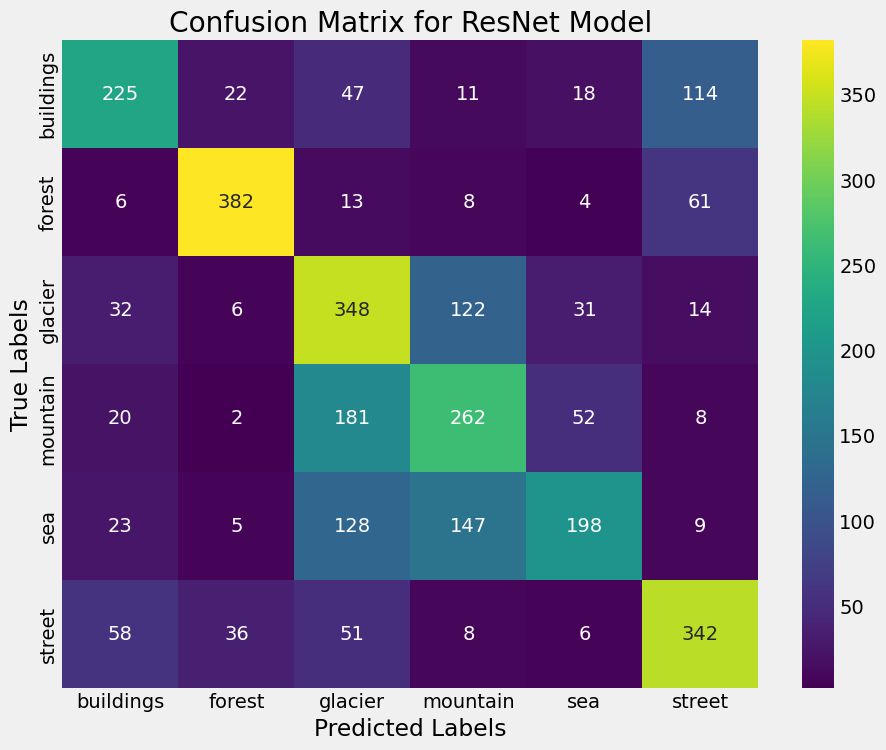

In [59]:

# Plot the confusion matrix using a heatmap.
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_resnet, annot=True, fmt='d', cmap='viridis',
            xticklabels=[index_to_label[i] for i in range(len(index_to_label))],
            yticklabels=[index_to_label[i] for i in range(len(index_to_label))])
plt.title('Confusion Matrix for ResNet Model')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()

# EfficientNet, ResNet and CNN Models Evaluation


The image shows a graph comparing the training history of three image classification models: EfficientNet, ResNet and a custom CNN built from scratch. The x-axis represents the epoch, which is one pass through the entire training dataset. The y-axis represents accuracy. We would notice that as the number of epochs increases, the training accuracy increases and the validation accuracy increases. This indicates that the model is learning the patterns in the training data.

In the graph, the custom CNN appears to have the best performance, reaching a training accuracy of close to 0.8 around 2.5 epochs. ResNet also seems to achieve a similar validation accuracy but takes more epochs to train. The EfficientNet model in the graph appears to have the lowest accuracy of the three models. It is important to note that the optimal number of epochs can vary depending on the dataset and model complexity. Overfitting can occur if the model is trained for too many epochs.


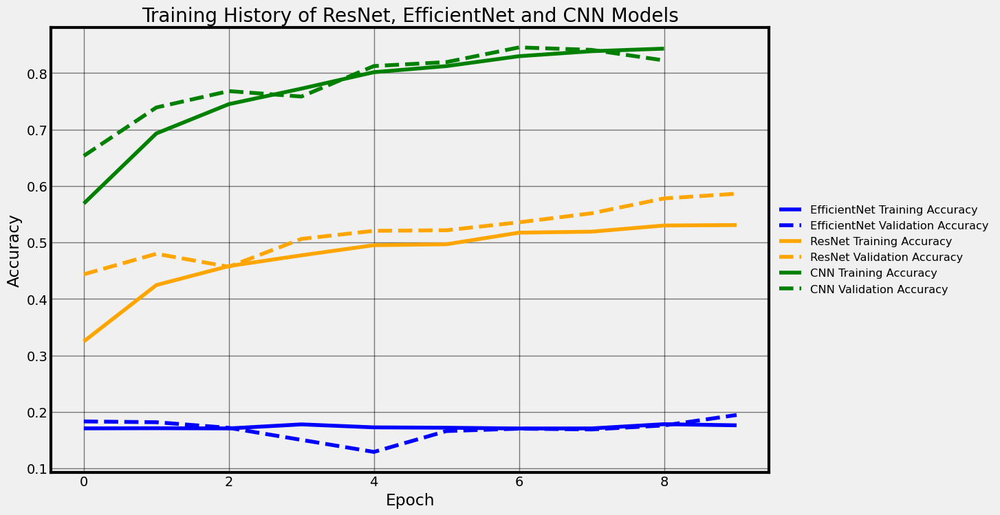

In [67]:
# Plot training history
plt.figure(figsize=(12, 8))

plt.plot(history_efficientnetb0_model.history['accuracy'], label='EfficientNet Training Accuracy', color='#0000FF')
plt.plot(history_efficientnetb0_model.history['val_accuracy'], label='EfficientNet Validation Accuracy', linestyle='--', color='#0000FF')

plt.plot(resnet50_history.history['accuracy'], label='ResNet Training Accuracy', color='#FFA500')
plt.plot(resnet50_history.history['val_accuracy'], label='ResNet Validation Accuracy', linestyle='--', color='#FFA500')

plt.plot(history_cnn_model.history['accuracy'], label='CNN Training Accuracy', color='#008000')
plt.plot(history_cnn_model.history['val_accuracy'], label='CNN Validation Accuracy', linestyle='--', color='#008000')

plt.xlabel('Epoch', color='black')
plt.ylabel('Accuracy', color='black')
plt.title('Training History of ResNet, EfficientNet and CNN Models', color='black')
plt.legend(fontsize='small', edgecolor='none', loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True, color='black', alpha=0.5)
plt.gca().set_facecolor('none')
plt.gca().spines['bottom'].set_color('black')
plt.gca().spines['top'].set_color('black')
plt.gca().spines['left'].set_color('black')
plt.gca().spines['right'].set_color('black')
plt.tick_params(axis='x', colors='black')
plt.tick_params(axis='y', colors='black')
plt.savefig('training_history.png', transparent=True, bbox_inches='tight')
plt.show()

# Limitations and potential areas of improvement.


- Data Similarity: The effectiveness of fine-tuned EfficientNetB0 and ResNet models depends on how closely the new task's data resembles the data from the original ImageNet dataset.
- Model Complexity for Task: While EfficientNetB0 and ResNet are powerful for image processing tasks, their suitability varies based on the complexity of the task and dataset size, and alternative architectures might offer improved results.
- Training Data Quantity and Quality: The performance of the model depends on both the quantity and the quality of the training data. An increase in dataset size or data quality through meticulous cleaning and preprocessing can boost the model's precision.
- Data Augmentation Scope: The current data augmentation techniques may not cover all possible variations in real-world images. Implementing more augmentation to include diverse transformations would improve model robustness.
- Fine-Tuning Strategy: Optimizing the fine-tuning approach by adjusting the number of layers unfrozen in the base model or modifying the learning rate during fine-tuning would effectively tailor the pre-trained weights to the specific requirements of the new task.
